<a href="https://colab.research.google.com/github/Oshada-Kasun/Retinal-Disease-Detection/blob/main/notebooks/ResNet50_Retinal_Disease_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## This notebook project is designed for automated pathology detection for Medical Images in a relalistic setup, each image may have multiple pathologies/disorders. 
### The goal, is to design models and methods to predictively detect pathological images and explain the pathology sites in the image data.

## Data for this project is taken from a Kaggle contest: https://www.kaggle.com/c/vietai-advance-course-retinal-disease-detection/overview
Explanation of the data set:
The training data set contains 3435 retinal images that represent multiple pathological disorders. The patholgy classes and corresponding labels are: included in 'train.csv' file and each image can have more than one class category (multiple pathologies).
The labels for each image are

```
-opacity (0), 
-diabetic retinopathy (1), 
-glaucoma (2),
-macular edema (3),
-macular degeneration (4),
-retinal vascular occlusion (5)
-normal (6)
```
The test data set containing 350 unlabelled images.

# Assuming that working with specialists for Diabetic Retinopathy and Glaucoma only, and client is interested in a predictive learning model along with feature explanability and self-learning for Diabetic Retinopathy and Glaucoma vs. Normal images.
# Designing models and methods for the following tasks. Each task has been accompanied by code, plots/images (if applicable), tables (if applicable) and text:

## Task 1: Building a classification model for Diabetic Retinopathy and Glaucoma vs normal images.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/FourthBrain/Week_8/ML\ for\ Computer\ Vision

/content/drive/MyDrive/FourthBrain/Week_8/ML for Computer Vision


In [ ]:
!pip install tensorflow.contrib

ERROR: Could not find a version that satisfies the requirement tensorflow.contrib (from versions: none)
ERROR: No matching distribution found for tensorflow.contrib


In [ ]:
import numpy as np
import pandas as pd
import os
import sys

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

import tensorflow as tf
import tensorflow.keras as keras


from fastprogress import master_bar, progress_bar

from PIL import Image
#from tensorflow.contrib.eager.python import tfe

# Enable Eager Execution
# tf.enable_eager_execution()
# tf.executing_eagerly() 

In [ ]:
print(tf.__version__)

2.7.0


In [ ]:
data = pd.read_csv("data/Data/train/train.csv")
data.head()

,filename,opacity,diabetic retinopathy,glaucoma,macular edema,macular degeneration,retinal vascular occlusion,normal
0,c24a1b14d253.jpg,0,0,0,0,0,1,0
1,9ee905a41651.jpg,0,0,0,0,0,1,0
2,3f58d128caf6.jpg,0,0,1,0,0,0,0
3,4ce6599e7b20.jpg,1,0,0,0,1,0,0
4,0def470360e4.jpg,1,0,0,0,1,0,0


**check distrbution on each label in training dataset**

In [ ]:
for label in data.columns[1:]:
    print("Distribution of", label)
    print(data[label].value_counts())

Distribution of opacity
0    1902
1    1533
Name: opacity, dtype: int64
Distribution of diabetic retinopathy
0    2680
1     755
Name: diabetic retinopathy, dtype: int64
Distribution of glaucoma
0    2838
1     597
Name: glaucoma, dtype: int64
Distribution of macular edema
0    2919
1     516
Name: macular edema, dtype: int64
Distribution of macular degeneration
0    2861
1     574
Name: macular degeneration, dtype: int64
Distribution of retinal vascular occlusion
0    2995
1     440
Name: retinal vascular occlusion, dtype: int64
Distribution of normal
0    2910
1     525
Name: normal, dtype: int64


**check combination of labels in training dataset**

In [ ]:
LABELS = data.columns[1:]
def build_label(row):
    return ",".join([LABELS[idx] for idx, val in enumerate(row[1:]) if val == 1])
        
data.apply(lambda x: build_label(x), axis=1).value_counts()

opacity                                                                  671
normal                                                                   525
glaucoma                                                                 327
macular degeneration                                                     299
diabetic retinopathy                                                     212
opacity,macular degeneration                                             212
opacity,diabetic retinopathy                                             186
retinal vascular occlusion                                               170
diabetic retinopathy,macular edema                                       162
opacity,diabetic retinopathy,macular edema                               154
opacity,glaucoma                                                         140
macular edema,retinal vascular occlusion                                  74
opacity,macular edema,retinal vascular occlusion                          62

In [ ]:
LABELS

Index(['opacity', 'diabetic retinopathy', 'glaucoma', 'macular edema',
       'macular degeneration', 'retinal vascular occlusion', 'normal'],
      dtype='object')

according to above information largest proportions in label distribution shared by **opacity**, **normal** and **glaucoma** diseases

### *Since this Model is for specialist of diabetic retinopathy and glaucoma only others label doesn't make interest for the model. so all other disorders will put into label called 'other' and 'normal' label will remain as it is. So only four labels will contain in training dataset*

In [ ]:
LABELS_NEW = ['diabetic retinopathy','glaucoma','normal','other']
data_new = data.copy()
data_new['other'] = data_new['opacity']+data_new['macular edema']+data_new['macular degeneration']+data_new['retinal vascular occlusion']
data_new.loc[data_new['other'] > 0, 'other'] = 1
data_new.drop(['opacity','macular edema','macular degeneration','retinal vascular occlusion'], axis = 1)

In [ ]:
for index,row in data_new.iterrows():
  # if(row['diabetic retinopathy'] ==1 or row['glaucoma']==1 or row['normal']==1):
  #   row['other']=0
  # else:
  #   count += 1
  if(row['other']==1):
    if(row['diabetic retinopathy'] ==1 or row['glaucoma']==1 or row['normal']==1):
      data_new['other'].values[index]=0


**distribution with combination of labels after relabeling**

In [ ]:
def build_label_new(row):
    return ",".join([LABELS_NEW[idx] for idx, val in enumerate(row[1:]) if val == 1])
        
data_new.apply(lambda x: build_label_new(x), axis=1).value_counts()

other                            1577
diabetic retinopathy              736
glaucoma                          578
normal                            525
diabetic retinopathy,glaucoma      19
dtype: int64

In [ ]:
data_new.head()

,filename,diabetic retinopathy,glaucoma,normal,other
0,c24a1b14d253.jpg,0,0,0,1
1,9ee905a41651.jpg,0,0,0,1
2,3f58d128caf6.jpg,0,1,0,0
3,4ce6599e7b20.jpg,0,0,0,1
4,0def470360e4.jpg,0,0,0,1


split training dataset for suggested propotion

In [ ]:
train_data, val_data = train_test_split(data_new, test_size=0.3, random_state=2019)

In [ ]:
len(train_data)

2404

In [ ]:
len(val_data)

1031

*ResNet5o used as baseline model with initial weights from ImageNet and will retrain all layers for this project*

In [ ]:
IMAGE_SIZE = 224                              # Image size (224x224)
IMAGENET_MEAN = [0.485, 0.456, 0.406]         # Mean of ImageNet dataset (used for normalization)
IMAGENET_STD = [0.229, 0.224, 0.225]          # Std of ImageNet dataset (used for normalization)
BATCH_SIZE = 64                             
LEARNING_RATE = 0.001
LEARNING_RATE_SCHEDULE_FACTOR = 0.1           # Parameter used for reducing learning rate
LEARNING_RATE_SCHEDULE_PATIENCE = 5           # Parameter used for reducing learning rate
MAX_EPOCHS = 120                              # Maximum number of training epochs

augmenting images, will have more data and make the training set become more regularize. In Keras *ImageDataGenerator* has used to feed image to the model. In case the augmentation of ImageDataGenerator is not enough, to add more from another library can implement *preproces_image* method below

In [ ]:
def preproces_image(image):
    
    # Preprocess image after resize and augment data with ImageDataGenerator
    
    ### Parameters ###
    # image: numpy tensor with rank 3
    #     image to preprocessing
    
    ### Returns ###
    # numpy tensor with rank 3
    
    # TODO: augment more here
    
    return image

Create data generator object and also training generator and validation generator

In [ ]:
train_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
                                                             featurewise_center=True,
                                                             featurewise_std_normalization=True,
                                                             preprocessing_function=preproces_image)

In [ ]:
def build_label_list(row):
    return [LABELS_NEW[idx] for idx, val in enumerate(row[1:]) if val == 1]
        
train_data["label"] = train_data.apply(lambda x: build_label_list(x), axis=1)
val_data["label"] = val_data.apply(lambda x: build_label_list(x), axis=1)

In [ ]:
train_gen = train_datagen.flow_from_dataframe(dataframe=train_data, 
                                        directory="data/Data/train/train", 
                                        x_col="filename", 
                                        y_col="label",
                                        class_mode="categorical",
                                        target_size=(IMAGE_SIZE,IMAGE_SIZE), 
                                        batch_size=BATCH_SIZE)

Found 2404 validated image filenames belonging to 4 classes.


In [ ]:
val_gen = train_datagen.flow_from_dataframe(dataframe=val_data, 
                                        directory="data/Data/train/train", 
                                        x_col="filename", 
                                        y_col="label",
                                        class_mode="categorical",
                                        shuffle=False,
                                        target_size=(IMAGE_SIZE,IMAGE_SIZE), 
                                        batch_size=BATCH_SIZE)

Found 1031 validated image filenames belonging to 4 classes.


In [ ]:
pwd

'/content/drive/My Drive/FourthBrain/Week_8/ML for Computer Vision'

*Define model with the baseline, ResNet50 has used which is pretrained on ImageNet dataset. The classifier of model would be replaced with a new dense layer to make the output suit to this project.*

In [ ]:
base_model = keras.applications.ResNet50(input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                                    include_top=False,
                                    weights='imagenet')
base_model.trainable = True

model = keras.Sequential([
  base_model,
  keras.layers.GlobalAveragePooling2D(),
  keras.layers.Dense(len(LABELS_NEW), activation='sigmoid')
])

model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_2   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_4 (Dense)             (None, 4)                 8196      
                                                                 
Total params: 23,595,908
Trainable params: 23,542,788
Non-trainable params: 53,120
_________________________________________________________________


Instead of average pooling to try with max pooling

In [ ]:
model2 = keras.Sequential([
  base_model,
  keras.layers.MaxPooling2D(),
  keras.layers.Dense(len(LABELS_NEW), activation='relu')
])

# Print out model summary
model2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 3, 3, 2048)       0         
 2D)                                                             
                                                                 
 dense_5 (Dense)             (None, 3, 3, 4)           8196      
                                                                 
Total params: 23,595,908
Trainable params: 23,542,788
Non-trainable params: 53,120
_________________________________________________________________


### F1-score metric

In [ ]:
import tensorflow.keras.backend as K

def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        # Recall metric.
        # Only computes a batch-wise average of recall.

        # Computes the recall, a metric for multi-label classification of
        # how many relevant items are selected.

        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        # Precision metric.
        # Only computes a batch-wise average of precision.

        # Computes the precision, a metric for multi-label classification of
        # how many selected items are relevant.
        
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision
        
    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

two callbacks were added to the training to save the best model on validation set and reduce learning rate during training.

In [ ]:
mcp = keras.callbacks.ModelCheckpoint("resnet50.h5", monitor="val_f1", save_best_only=True, save_weights_only=True, verbose=1,mode='max')
rlr = keras.callbacks.ReduceLROnPlateau(monitor='val_f1', factor=LEARNING_RATE_SCHEDULE_FACTOR, mode='max', patience=LEARNING_RATE_SCHEDULE_PATIENCE, min_lr=1e-8, verbose=1)
callbacks = [mcp, rlr]

In [ ]:
steps_per_epoch = train_gen.n // BATCH_SIZE
validation_steps = val_gen.n // BATCH_SIZE

In [ ]:
validation_steps

16

***Training the full model***

In [ ]:
model.compile(optimizer=keras.optimizers.Adam(lr=LEARNING_RATE), loss='binary_crossentropy', metrics=[f1])
history = model.fit(train_gen,
                              steps_per_epoch=steps_per_epoch,
                              epochs= MAX_EPOCHS,
                              verbose=1,
                              validation_data=val_gen,
                              validation_steps=validation_steps,
                              callbacks=callbacks)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/120
37/37 [==============================] - ETA: 0s - loss: 0.3547 - f1: 0.6614
Epoch 00001: val_f1 did not improve from 0.16170
37/37 [==============================] - 23s 480ms/step - loss: 0.3547 - f1: 0.6614 - val_loss: 2.1356 - val_f1: 0.0000e+00 - lr: 0.0010
Epoch 2/120
37/37 [==============================] - ETA: 0s - loss: 0.2797 - f1: 0.7524
Epoch 00002: val_f1 did not improve from 0.16170
37/37 [==============================] - 17s 458ms/step - loss: 0.2797 - f1: 0.7524 - val_loss: 10.3380 - val_f1: 0.0000e+00 - lr: 0.0010
Epoch 3/120
37/37 [==============================] - ETA: 0s - loss: 0.2315 - f1: 0.7973
Epoch 00003: val_f1 improved from 0.16170 to 0.47251, saving model to resnet50.h5
37/37 [==============================] - 19s 505ms/step - loss: 0.2315 - f1: 0.7973 - val_loss: 0.6877 - val_f1: 0.4725 - lr: 0.0010
Epoch 4/120
37/37 [==============================] - ETA: 0s - loss: 0.1999 - f1: 0.8287
Epoch 00004: val_f1 did not improve from 0.47251
37/37 [

In [ ]:
# model.compile(optimizer = Adam(lr = 1e-4), loss = 'binary_crossentropy', metrics = 'accuracy')
# model.fit(data_gen,steps_per_epoch=15,epochs=25,verbose=1)#callbacks=[tensorboard_callback])

***preprocess test images to predic the result of trained model***

In [ ]:
images_names = os.listdir('data/Data/test/test/')
prediction = ["0 0"] * len(images_names)

In [ ]:
test_df = pd.DataFrame({'filename': images_names, 'predicted': prediction})
test_df.head()

,filename,predicted
0,012df36af16b.jpg,0 0
1,0157f50bdb02.jpg,0 0
2,026aa5bc0aea.jpg,0 0
3,03e7e29071a5.jpg,0 0
4,071ac96c6277.jpg,0 0


***Load best model weights and switch to evaluation mode to predict test images***

In [ ]:
test_gen = train_datagen.flow_from_dataframe(dataframe=test_df,
                                             directory="data/Data/test/test",
                                             x_col="filename",
                                             class_mode=None,
                                             shuffle=False,
                                             target_size=(IMAGE_SIZE,IMAGE_SIZE),
                                             batch_size=BATCH_SIZE)

Found 350 validated image filenames.


In [ ]:
model.load_weights("resnet50.h5")

In [ ]:
pred = model.predict_generator(test_gen)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


In [ ]:
labels = (train_gen.class_indices)
labels = dict((v,k) for k,v in labels.items())
labels
LABELS = list(LABELS_NEW)

def probs2label(probs):
    ''' Return real index following LABELS
    '''
    global LABELS, labels
    result = " ".join([str(LABELS.index(labels[idx])) for idx, prob in enumerate(probs) if prob > 0.5])
    print(result)
    return result

In [ ]:
LABELS

['diabetic retinopathy', 'glaucoma', 'normal', 'other']

In [ ]:
for idx, row in test_df.iterrows():
    test_df.loc[idx]['predicted'] = probs2label(pred[idx])

3
0
3
1
0
3
0 3
3
3
3
3
3
1
3

3
3
0
0
2
2
0 3
1
3
3
3
2
3
3
3
1 3
3
3
2
3
1
0
3
2
3
1 3
0
3
3
0
3
0 3
0
2
0
1
3
3
3

2

3
3

3
0

0
1
3
3
0
2
1

3
3
2

3
0
1
1
3
3
0
3
3
3
2
1
3
1
3
2
3
1
3
1

2
0 3
3
1
3
0
1
2
3
3
0
2
2
3

3
3
3

1
3

2

2
2

3
3
3
3
3
1
1
3
2

3
3

3
2
2
0
0
0
3
0
0
0
3
0
0
3
3
3
0
3
3
0
3
3
0
3
0
1
0
3
0
1
1
0
0
0
3
1
3
1
0
2
1
2

3
3
3
0 3
3
1
0
1
0
1
3
3
3
3
1
1 3
0
3
0
3
2

3
3
3
2
3
0
3
3
0
0
1
3
2
3
2
0
1
0
0
0
3

3
0
2
2
2
3
3
3
3
3
2
3
3
1
1
3


3
2
1
2
3
1
3
3
1
0
3
3
1

2
3
3
1
3
3
1 3
1

3

3
3
0

2



3
2
3
1
3
3
3
3
0
0
1
0
3
0
2
3
0
3
3
0
3
1
1
3
3
0
0
3
3
3
3
2
3
2

3
3
2
2
1
2
3
3
3
1
0
1
2
2
1
1
2
1
3
3
3
0
0

2
1
3
3
3
0
1
1
0
3
3
0
2
0
3
3



In [ ]:
test_df.head(100)

,filename,predicted
0,012df36af16b.jpg,3
1,0157f50bdb02.jpg,0
2,026aa5bc0aea.jpg,3
3,03e7e29071a5.jpg,1
4,071ac96c6277.jpg,0
...,...,...
95,45a9a190d974.jpg,
96,474a91fb70d1.jpg,2
97,489a8eca4c9b.jpg,0 3
98,4819d3d87d8c.jpg,3


***write test result to CSV file***

In [ ]:
test_df.to_csv("data/Data/test/test.csv", index=False)

***Showing the Training-validation curves to ensure overfitting and underfitting is avoided.***

dict_keys(['loss', 'f1', 'val_loss', 'val_f1', 'lr'])


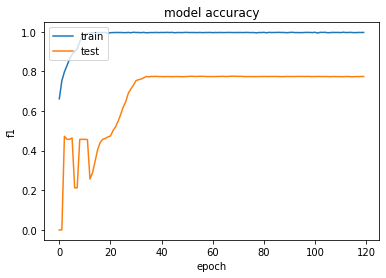

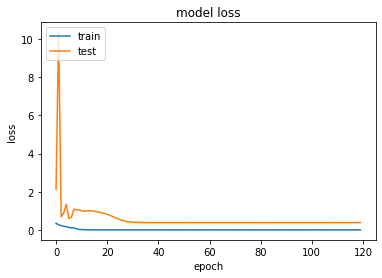

In [ ]:
import matplotlib.pyplot as plt
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['f1'])
plt.plot(history.history['val_f1'])
plt.title('model accuracy')
plt.ylabel('f1')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

[result folder](https://drive.google.com/drive/folders/1eVVyEXzzZ2UjJzMDHpWFa5xpPTL0-Jfp?usp=sharing)

## Task 2: Visualizing the heatmap/saliency/features to demonstrate what regions of interest contribute to Diabetic Retinopathy and Glaucoma, respectively.

In [ ]:
model.save('resnet50_pathology.hdf5')

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
dependencies = { 'f1': f1 }
model=load_model('resnet50_pathology.hdf5',custom_objects=dependencies)

In [ ]:
test_df = pd.read_csv("data/Data/test/test.csv")
test_df.head()

,filename,predicted
0,012df36af16b.jpg,3
1,0157f50bdb02.jpg,0
2,026aa5bc0aea.jpg,3
3,03e7e29071a5.jpg,1
4,071ac96c6277.jpg,0


In [ ]:
def load_and_prep_image(filename, img_shape=224):
  """
  Reads an image from filename, turns it into a tensor
  and reshapes it to (img_shape, img_shape, colour_channel).
  """
  # Read in target file (an image)
  img = tf.io.read_file(filename)

  # Decode the read file into a tensor & ensure 3 colour channels 
  # (our model is trained on images with 3 colour channels and sometimes images have 4 colour channels)
  img = tf.image.decode_image(img, channels=3)

  # Resize the image (to the same size our model was trained on)
  img = tf.image.resize(img, size = [img_shape, img_shape])

  # Rescale the image (get all values between 0 and 1)
  img = img/255.
  return img

In [ ]:
test_image_names = test_df['filename'].values.tolist()

In [ ]:
# Load in and preprocess our custom image
predImg = load_and_prep_image("data/Data/test/test/"+test_image_names[1])

In [ ]:
predImg.shape

TensorShape([224, 224, 3])

In [ ]:
# Add an extra axis
print(f"Shape before new dimension: {predImg.shape}")
predImg = tf.expand_dims(predImg, axis=0) # add an extra dimension at axis 0
#steak = steak[tf.newaxis, ...] # alternative to the above, '...' is short for 'every other dimension'
print(f"Shape after new dimension: {predImg.shape}")

Shape before new dimension: (224, 224, 3)
Shape after new dimension: (1, 224, 224, 3)


In [ ]:
pred = model.predict(predImg)
pred

array([[ 1.9324417, -5.5689797, -8.867945 , -1.4635087]], dtype=float32)

In [ ]:
np.argmax(pred)

0

In [ ]:
!pip install tf-keras-vis tensorflow

     |████████████████████████████████| 53 kB 1.3 MB/s 


In [ ]:
from tf_keras_vis.utils import num_of_gpus
_, gpus = num_of_gpus()
print('Tensorflow recognized {} GPUs'.format(gpus))

Tensorflow recognized 0 GPUs


In [ ]:
test_df_with_0_1 = test_df[(test_df['predicted'] != '2') & (test_df['predicted'] != '3')]
test_df_with_0_1

,filename,predicted
1,0157f50bdb02.jpg,0
3,03e7e29071a5.jpg,1
4,071ac96c6277.jpg,0
6,086144e3606c.jpg,0 3
12,0be58442cd00.jpg,1
...,...,...
340,f9d5e43ada76.jpg,1
341,fb7d093f6d5c.jpg,0
344,fdc6db50027d.jpg,0
346,fe929c502d3a.jpg,0


In [ ]:
selected_image_titles = test_df_with_0_1['filename'].values.tolist()
len(selected_image_titles)

153

In [ ]:
# Load images and Convert them to a Numpy array
from keras.preprocessing.image import load_img
img_as_np_array = []
for index, row in test_df_with_0_1.iterrows():
  img = load_img("data/Data/test/test/"+row['filename'], target_size=(224, 224))
  img_as_np_array.append(np.array(img))
selected_images = np.asarray(img_as_np_array)

In [ ]:
selected_images.shape

(153, 224, 224, 3)

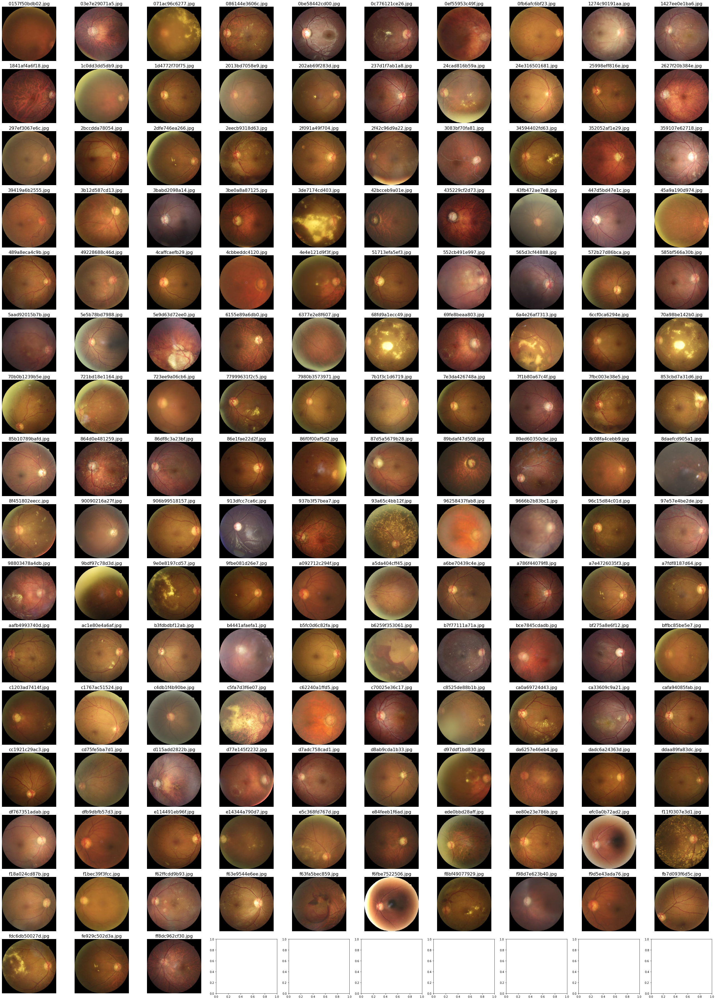

In [ ]:
#from tensorflow.keras.applications.ResNet50 import preprocess_input
import matplotlib.pyplot as plt
# Image titles
image_titles = selected_image_titles

# Load images and Convert them to a Numpy array
# img1 = load_img("data/Data/test/test/"+images_names[1], target_size=(224, 224))
# img2 = load_img("data/Data/test/test/"+images_names[3], target_size=(224, 224))
# img3 = load_img("data/Data/test/test/"+images_names[19], target_size=(224, 224))
# images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])

# Preparing input data for ResNet50
X = keras.applications.resnet50.preprocess_input(selected_images)

# Rendering
f, ax = plt.subplots(nrows=16, ncols=10, figsize=(36, 50))
ax = ax.flatten()
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear

replace2linear = ReplaceToLinear()

In [ ]:
LABELS_NEW

['diabetic retinopathy', 'glaucoma', 'normal', 'other']

***since 'diabetic retinopathy' and 'glaucoma' are the labels that we gonna visualize with saliency, corresponding scores will be 0 and 1***

In [ ]:
from tf_keras_vis.utils.scores import CategoricalScore

# 0 is the imagenet index corresponding to 'diabetic retinopathy', 1 to 'glaucoma'.
score = CategoricalScore([0, 1])

In [ ]:
X = keras.applications.resnet50.preprocess_input(selected_images)
image_titles = selected_image_titles

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Jan  2 05:27:57 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    34W / 250W |   8237MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


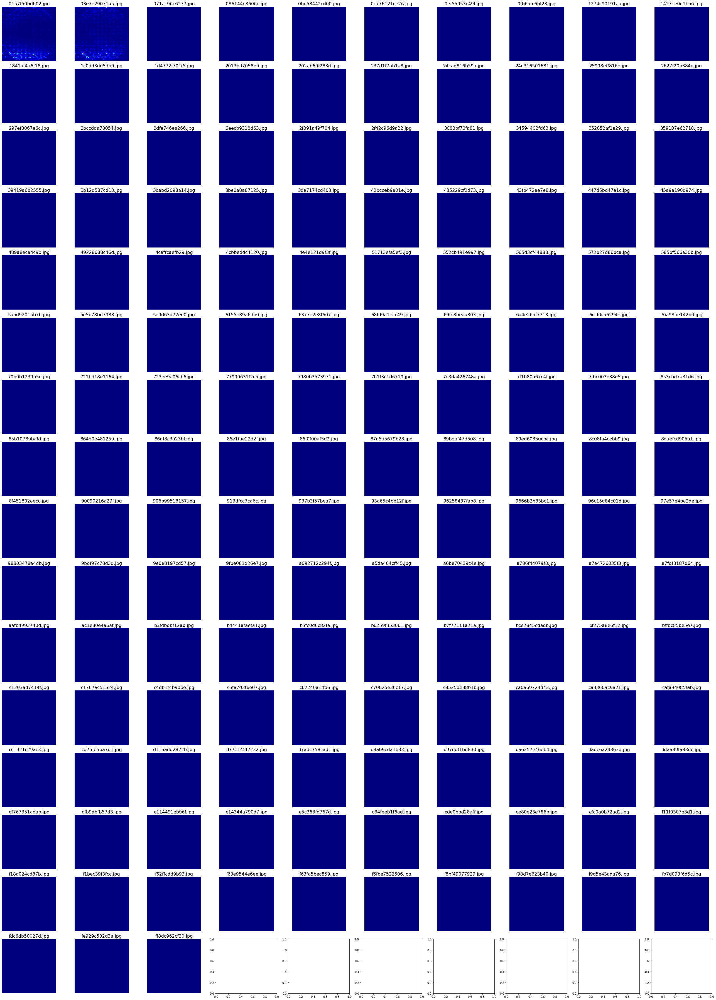

In [ ]:
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency
import matplotlib.pyplot as plt
# from tf_keras_vis.utils import normalize

# Create Saliency object.
saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

# Generate saliency map
saliency_map = saliency(score, X)

## Since v0.6.0, calling `normalize()` is NOT necessary.
# saliency_map = normalize(saliency_map)

# Render
f, ax = plt.subplots(nrows=16, ncols=10, figsize=(36, 50))
ax = ax.flatten()
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(saliency_map[i], cmap='jet')
    ax[i].axis('off')
plt.tight_layout()
plt.savefig('data/Data/test/saliency/saliency.png')
plt.show()

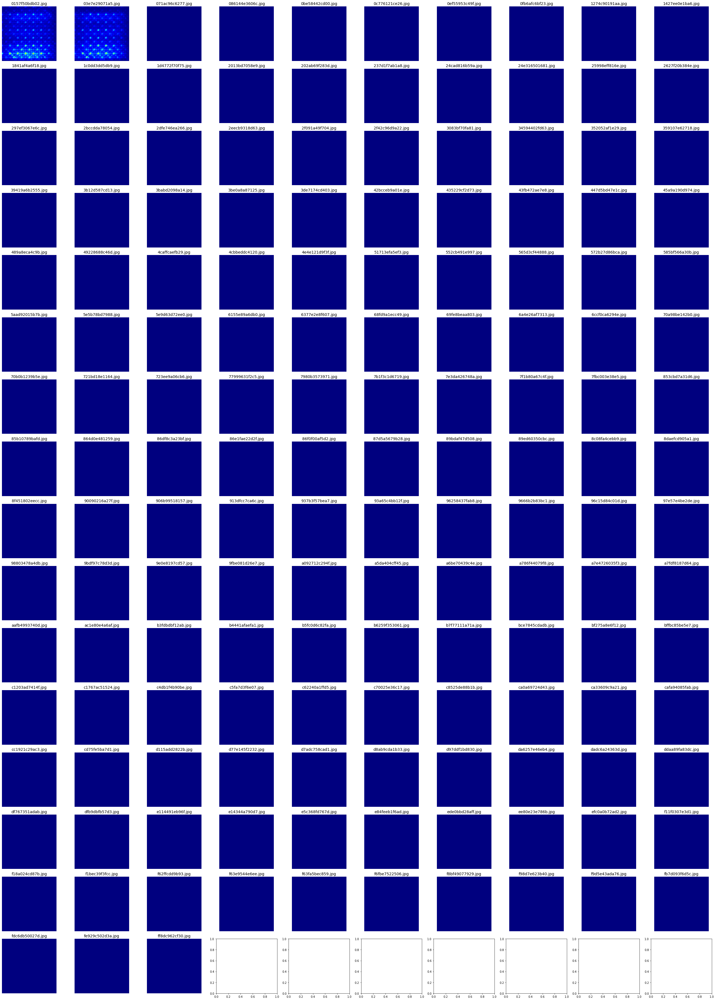

CPU times: user 1h 17min 53s, sys: 2min 3s, total: 1h 19min 57s
Wall time: 5min 12s


In [ ]:
%%time

# Generate saliency map with smoothing that reduce noise by adding noise
saliency_map = saliency(score,
                        X,
                        smooth_samples=20, # The number of calculating gradients iterations.
                        smooth_noise=0.20) # noise spread level.

## Since v0.6.0, calling `normalize()` is NOT necessary.
# saliency_map = normalize(saliency_map)

# Render
f, ax = plt.subplots(nrows=16, ncols=10, figsize=(36, 50))
ax = ax.flatten()

for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=14)
    ax[i].imshow(saliency_map[i], cmap='jet')
    ax[i].axis('off')
plt.tight_layout()
plt.savefig('data/Data/test/smoothgrad/smoothgrad.png')
plt.show()

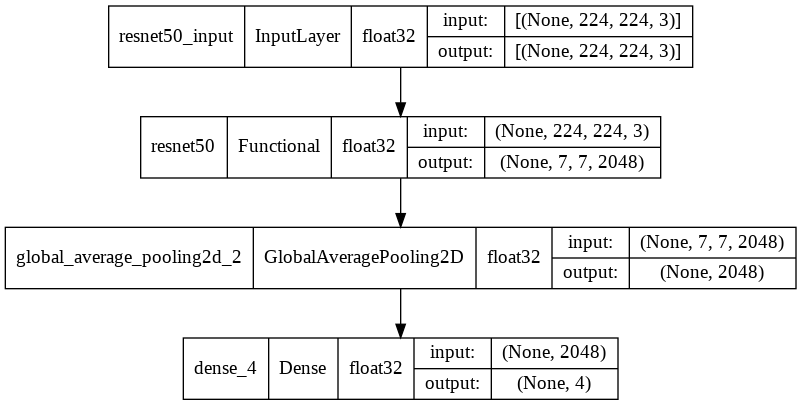

In [ ]:
keras.utils.plot_model(model, show_shapes=True, show_dtype=True)

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_2   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_4 (Dense)             (None, 4)                 8196      
                                                                 
Total params: 23,595,908
Trainable params: 23,542,788
Non-trainable params: 53,120
_________________________________________________________________


In [ ]:


from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)

# Generate heatmap with GradCAM++
cam = gradcam(score,
              X,
              penultimate_layer=-1)

## Since v0.6.0, calling `normalize()` is NOT necessary.
# cam = normalize(cam)

# Render
f, ax = plt.subplots(nrows=16, ncols=10, figsize=(36, 50))
ax = ax.flatten()
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(selected_images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
    ax[i].axis('off')
plt.tight_layout()
plt.savefig('images/gradcam_plus_plus.png')
plt.show()

## Task 3: Using the unlabelled data set in the 'test' folder augmenting the training data (semi-supervised learning) and reporting the variation in classification performance on test data set.

In [ ]:
layer_name = 'global_average_pooling2d_2'
layer_output = model.get_layer(layer_name).output

In [ ]:
test_image_titles = test_df['filename'].values.tolist()
len(test_image_titles)

350

In [ ]:
# Load images and Convert them to a Numpy array
from keras.preprocessing.image import load_img
img_as_np_array = []
for index, row in test_df.iterrows():
  img = load_img("data/Data/test/test/"+row['filename'], target_size=(224, 224))
  img_as_np_array.append(np.array(img))
test_images = np.asarray(img_as_np_array)

In [ ]:
from tensorflow.keras.models import Model
X=list()
Y=list()
for i in range(np.shape(test_images)[0]):
    print(i)
    img=test_images[i]
    # Now extract the dense layer outcome 
    model_op = Model(model.input, outputs=[layer_output])
    img = np.expand_dims(img,axis=0)
    result = model_op.predict(img)
    X.append(result)
    label=np.argmax(model.predict(img))
    Y.append(label)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [ ]:
print("The dense features extracted=",np.shape(X))
print("The labels extracted are=", np.shape(Y))

The dense features extracted= (350, 1, 2048)
The labels extracted are= (350,)


In [ ]:
data = pd.read_csv("data/Data/train/train.csv")
data.head()


,filename,opacity,diabetic retinopathy,glaucoma,macular edema,macular degeneration,retinal vascular occlusion,normal
0,c24a1b14d253.jpg,0,0,0,0,0,1,0
1,9ee905a41651.jpg,0,0,0,0,0,1,0
2,3f58d128caf6.jpg,0,0,1,0,0,0,0
3,4ce6599e7b20.jpg,1,0,0,0,1,0,0
4,0def470360e4.jpg,1,0,0,0,1,0,0


In [ ]:
LABELS_NEW = ['diabetic retinopathy','glaucoma','normal','other']
data_new = data.copy()
data_new['other'] = data_new['opacity']+data_new['macular edema']+data_new['macular degeneration']+data_new['retinal vascular occlusion']
data_new.loc[data_new['other'] > 0, 'other'] = 1
data_new.drop(['opacity','macular edema','macular degeneration','retinal vascular occlusion'], axis = 1,inplace =True)

In [ ]:
for index,row in data_new.iterrows():
  # if(row['diabetic retinopathy'] ==1 or row['glaucoma']==1 or row['normal']==1):
  #   row['other']=0
  # else:
  #   count += 1
  if(row['other']==1):
    if(row['diabetic retinopathy'] ==1 or row['glaucoma']==1 or row['normal']==1):
      data_new['other'].values[index]=0


In [ ]:
data_new

,filename,diabetic retinopathy,glaucoma,normal,other
0,c24a1b14d253.jpg,0,0,0,1
1,9ee905a41651.jpg,0,0,0,1
2,3f58d128caf6.jpg,0,1,0,0
3,4ce6599e7b20.jpg,0,0,0,1
4,0def470360e4.jpg,0,0,0,1
...,...,...,...,...,...
3430,315991e4e5d3.jpg,0,0,1,0
3431,46ff848f59d4.jpg,0,0,1,0
3432,2477323c9434.jpg,0,0,1,0
3433,0a1ca36be2c5.jpg,0,0,1,0


In [ ]:
labeled_test_df = pd.DataFrame(columns=['filename','diabetic retinopathy','glaucoma','normal','other'])

In [ ]:
[range(10)]

[range(0, 10)]

In [ ]:
for i in range(len(Y)):
  labeled_test_df.loc[i] = [test_image_titles[i],0,0,0,0]
  labeled_test_df.loc[i][LABELS_NEW[Y[i]]]=1


In [ ]:
labeled_test_df

,filename,diabetic retinopathy,glaucoma,normal,other
0,012df36af16b.jpg,0,0,1,0
1,0157f50bdb02.jpg,0,0,1,0
2,026aa5bc0aea.jpg,0,0,1,0
3,03e7e29071a5.jpg,0,0,1,0
4,071ac96c6277.jpg,0,0,1,0
...,...,...,...,...,...
345,fe440994a53a.jpg,0,0,1,0
346,fe929c502d3a.jpg,0,0,1,0
347,fec93b647234.jpg,0,0,1,0
348,ff10d9cabf72.jpg,0,0,1,0


In [ ]:
frames = [data_new, labeled_test_df]

#concatenate dataframes
data_training_df = pd.concat(frames)

# reset index
data_training_df.reset_index(drop=True, inplace=True)

In [ ]:
data_training_df

,filename,diabetic retinopathy,glaucoma,normal,other
0,c24a1b14d253.jpg,0,0,0,1
1,9ee905a41651.jpg,0,0,0,1
2,3f58d128caf6.jpg,0,1,0,0
3,4ce6599e7b20.jpg,0,0,0,1
4,0def470360e4.jpg,0,0,0,1
...,...,...,...,...,...
3780,fe440994a53a.jpg,0,0,1,0
3781,fe929c502d3a.jpg,0,0,1,0
3782,fec93b647234.jpg,0,0,1,0
3783,ff10d9cabf72.jpg,0,0,1,0


In [ ]:
train_data, val_data = train_test_split(data_training_df, test_size=0.3, random_state=2019)

In [ ]:
len(train_data)

2649

In [ ]:
len(val_data)

1136

***include both train and test images in one folder***

In [ ]:
from distutils.dir_util import copy_tree

source_dir = "data/Data/train/train"
destination_dir = "data/Data/new_train/train"
copy_tree(source_dir, destination_dir)

['data/Data/new_train/train/70b208d26c26.jpg',
 'data/Data/new_train/train/718678114403.jpg',
 'data/Data/new_train/train/71ce58dabc71.jpg',
 'data/Data/new_train/train/71dacc1bf642.jpg',
 'data/Data/new_train/train/71dbcf02b889.jpg',
 'data/Data/new_train/train/71e0c28bea33.jpg',
 'data/Data/new_train/train/7216b1244d43.jpg',
 'data/Data/new_train/train/7239d9044fea.jpg',
 'data/Data/new_train/train/723c22540360.jpg',
 'data/Data/new_train/train/72a8d7f6e2e6.jpg',
 'data/Data/new_train/train/72fa4e16b0c6.jpg',
 'data/Data/new_train/train/73368f4d840d.jpg',
 'data/Data/new_train/train/74112239a85c.jpg',
 'data/Data/new_train/train/7483931d7b29.jpg',
 'data/Data/new_train/train/752c01a374d7.jpg',
 'data/Data/new_train/train/75647b2a522d.jpg',
 'data/Data/new_train/train/7584a283ef54.jpg',
 'data/Data/new_train/train/75f2871bc53e.jpg',
 'data/Data/new_train/train/76595066dc4c.jpg',
 'data/Data/new_train/train/769feced507f.jpg',
 'data/Data/new_train/train/76b16d32eece.jpg',
 'data/Data/n

In [ ]:
source_dir = "data/Data/test/test"
destination_dir = "data/Data/new_train/train"
copy_tree(source_dir, destination_dir)

['data/Data/new_train/train/012df36af16b.jpg',
 'data/Data/new_train/train/0157f50bdb02.jpg',
 'data/Data/new_train/train/026aa5bc0aea.jpg',
 'data/Data/new_train/train/03e7e29071a5.jpg',
 'data/Data/new_train/train/071ac96c6277.jpg',
 'data/Data/new_train/train/07e4191fa3a8.jpg',
 'data/Data/new_train/train/086144e3606c.jpg',
 'data/Data/new_train/train/0933da5cbc6a.jpg',
 'data/Data/new_train/train/096bbc178e17.jpg',
 'data/Data/new_train/train/0a2229abced7.jpg',
 'data/Data/new_train/train/0afcc6fb9757.jpg',
 'data/Data/new_train/train/0baea1ca7a97.jpg',
 'data/Data/new_train/train/0be58442cd00.jpg',
 'data/Data/new_train/train/0c76ac934dd0.jpg',
 'data/Data/new_train/train/0c776121ce26.jpg',
 'data/Data/new_train/train/0e5235b62de8.jpg',
 'data/Data/new_train/train/0e8f6f78de8e.jpg',
 'data/Data/new_train/train/0ef55953c49f.jpg',
 'data/Data/new_train/train/0fb6afc6bf23.jpg',
 'data/Data/new_train/train/1110107617e8.jpg',
 'data/Data/new_train/train/1161e7d9e5dd.jpg',
 'data/Data/n

In [ ]:
train_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
                                                             featurewise_center=True,
                                                             featurewise_std_normalization=True,
                                                             preprocessing_function=preproces_image)

In [ ]:
def build_label_list(row):
    return [LABELS_NEW[idx] for idx, val in enumerate(row[1:]) if val == 1]
        
train_data["label"] = train_data.apply(lambda x: build_label_list(x), axis=1)
val_data["label"] = val_data.apply(lambda x: build_label_list(x), axis=1)

In [ ]:
train_gen = train_datagen.flow_from_dataframe(dataframe=train_data, 
                                        directory="data/Data/new_train/train", 
                                        x_col="filename", 
                                        y_col="label",
                                        class_mode="categorical",
                                        target_size=(IMAGE_SIZE,IMAGE_SIZE), 
                                        batch_size=BATCH_SIZE)

Found 2649 validated image filenames belonging to 4 classes.


In [ ]:
val_gen = train_datagen.flow_from_dataframe(dataframe=val_data, 
                                        directory="data/Data/new_train/train", 
                                        x_col="filename", 
                                        y_col="label",
                                        class_mode="categorical",
                                        shuffle=False,
                                        target_size=(IMAGE_SIZE,IMAGE_SIZE), 
                                        batch_size=BATCH_SIZE)

Found 1136 validated image filenames belonging to 4 classes.


In [ ]:
base_model = keras.applications.ResNet50(input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),
                                    include_top=False,
                                    weights='imagenet')
base_model.trainable = True

model_new = keras.Sequential([
  base_model,
  keras.layers.GlobalAveragePooling2D(),
  keras.layers.Dense(len(LABELS_NEW), activation='sigmoid')
])

model_new.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 4)                 8196      
                                                                 
Total params: 23,595,908
Trainable params: 23,542,788
Non-trainable params: 53,120
_________________________________________________________________


In [ ]:
mcp = keras.callbacks.ModelCheckpoint("resnet50_pathology_new.h5", monitor="val_f1", save_best_only=True, save_weights_only=True, verbose=1,mode='max')
rlr = keras.callbacks.ReduceLROnPlateau(monitor='val_f1', factor=LEARNING_RATE_SCHEDULE_FACTOR, mode='max', patience=LEARNING_RATE_SCHEDULE_PATIENCE, min_lr=1e-8, verbose=1)
callbacks = [mcp, rlr]

In [ ]:
steps_per_epoch = train_gen.n // BATCH_SIZE
validation_steps = val_gen.n // BATCH_SIZE

In [ ]:
model_new.compile(optimizer=keras.optimizers.Adam(lr=LEARNING_RATE), loss='binary_crossentropy', metrics=[f1])
history_new = model_new.fit(train_gen,
                              steps_per_epoch=steps_per_epoch,
                              epochs= MAX_EPOCHS,
                              verbose=1,
                              validation_data=val_gen,
                              validation_steps=validation_steps,
                              callbacks=callbacks)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/120
41/41 [==============================] - ETA: 0s - loss: 0.4628 - f1: 0.4724
Epoch 00001: val_f1 improved from -inf to 0.00000, saving model to resnet50_pathology_new.h5
41/41 [==============================] - 215s 5s/step - loss: 0.4628 - f1: 0.4724 - val_loss: 25.8950 - val_f1: 0.0000e+00 - lr: 0.0010
Epoch 2/120
41/41 [==============================] - ETA: 0s - loss: 0.3844 - f1: 0.6080
Epoch 00002: val_f1 improved from 0.00000 to 0.29367, saving model to resnet50_pathology_new.h5
41/41 [==============================] - 206s 5s/step - loss: 0.3844 - f1: 0.6080 - val_loss: 2.2324 - val_f1: 0.2937 - lr: 0.0010
Epoch 3/120
41/41 [==============================] - ETA: 0s - loss: 0.3382 - f1: 0.6784
Epoch 00003: val_f1 did not improve from 0.29367
41/41 [==============================] - 205s 5s/step - loss: 0.3382 - f1: 0.6784 - val_loss: 0.6692 - val_f1: 0.1440 - lr: 0.0010
Epoch 4/120
41/41 [==============================] - ETA: 0s - loss: 0.3089 - f1: 0.7177
Epoch 00

In [ ]:
model_new.save('resnet50_pathology_new.hdf5')

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


dict_keys(['loss', 'f1', 'val_loss', 'val_f1', 'lr'])


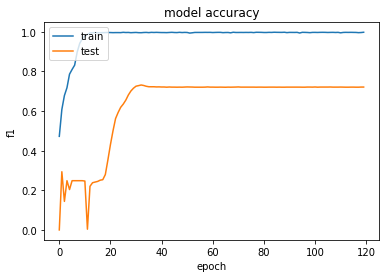

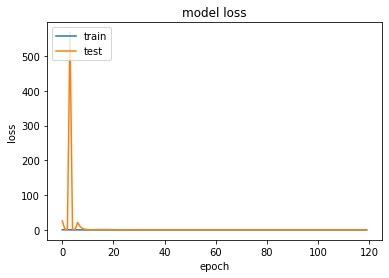

In [ ]:
import matplotlib.pyplot as plt
# list all data in history
print(history_new.history.keys())
# summarize history for accuracy
plt.plot(history_new.history['f1'])
plt.plot(history_new.history['val_f1'])
plt.title('model accuracy')
plt.ylabel('f1')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_new.history['loss'])
plt.plot(history_new.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()